# Task 1

In [39]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
from sklearn import preprocessing
from sklearn import datasets
from sklearn import metrics
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.model_selection import StratifiedKFold,KFold,cross_validate
from sklearn.preprocessing import MinMaxScaler , StandardScaler
from sklearn.model_selection import train_test_split
import scipy.stats
from sklearn.metrics import mean_absolute_error, mean_squared_error,r2_score
from sklearn.metrics import confusion_matrix,classification_report,roc_curve
from sklearn.metrics import accuracy_score,recall_score,f1_score,precision_score
from sklearn.metrics import roc_auc_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_predict,cross_val_score,GridSearchCV,train_test_split
import warnings
warnings.simplefilter(action='ignore')
from sklearn.svm import SVC
from sklearn.svm import SVR
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import VotingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import AdaBoostRegressor
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm
from sklearn.datasets import make_blobs 
from sklearn.cluster import KMeans,DBSCAN,AgglomerativeClustering
from sklearn.datasets import load_wine
from sklearn.neighbors import NearestNeighbors

In [2]:
data = load_wine()
df=pd.DataFrame(data.data,columns=data.feature_names)
df

,alcohol,malic_acid,ash,alcalinity_of_ash,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,proanthocyanins,color_intensity,hue,od280/od315_of_diluted_wines,proline
0,14.23,1.71,2.43,15.6,127.0,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065.0
1,13.20,1.78,2.14,11.2,100.0,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050.0
2,13.16,2.36,2.67,18.6,101.0,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185.0
3,14.37,1.95,2.50,16.8,113.0,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480.0
4,13.24,2.59,2.87,21.0,118.0,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,13.71,5.65,2.45,20.5,95.0,1.68,0.61,0.52,1.06,7.70,0.64,1.74,740.0
174,13.40,3.91,2.48,23.0,102.0,1.80,0.75,0.43,1.41,7.30,0.70,1.56,750.0
175,13.27,4.28,2.26,20.0,120.0,1.59,0.69,0.43,1.35,10.20,0.59,1.56,835.0
176,13.17,2.59,2.37,20.0,120.0,1.65,0.68,0.53,1.46,9.30,0.60,1.62,840.0


In [27]:
df.shape

(178, 16)

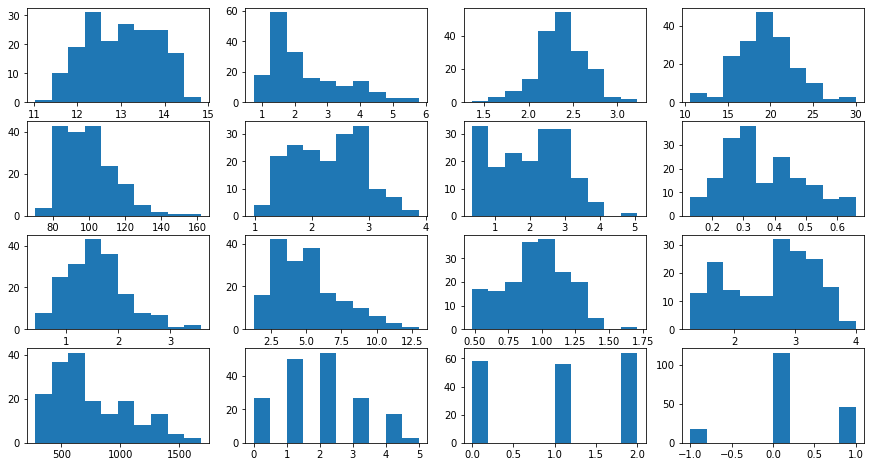

In [29]:
fig,ax=plt.subplots(4,4,figsize=(15,8))
for i in (range(len(df.columns))):
    ax[i//4,i%4].hist(df[df.columns[i]])

In [3]:
ss=StandardScaler()
x=ss.fit_transform(df)
x

array([[ 1.51861254, -0.5622498 ,  0.23205254, ...,  0.36217728,
         1.84791957,  1.01300893],
       [ 0.24628963, -0.49941338, -0.82799632, ...,  0.40605066,
         1.1134493 ,  0.96524152],
       [ 0.19687903,  0.02123125,  1.10933436, ...,  0.31830389,
         0.78858745,  1.39514818],
       ...,
       [ 0.33275817,  1.74474449, -0.38935541, ..., -1.61212515,
        -1.48544548,  0.28057537],
       [ 0.20923168,  0.22769377,  0.01273209, ..., -1.56825176,
        -1.40069891,  0.29649784],
       [ 1.39508604,  1.58316512,  1.36520822, ..., -1.52437837,
        -1.42894777, -0.59516041]])

# Task 2

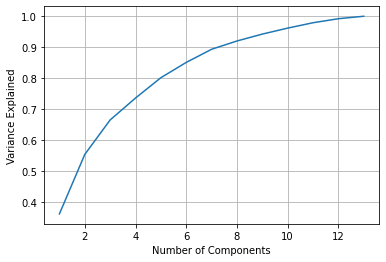

In [4]:
v = []
for n in range(1,14):
    pca = PCA(n_components=n)
    pca.fit(x)
    
    v.append(sum(pca.explained_variance_ratio_))
plt.plot(range(1,14),v)
plt.grid()
plt.xlabel("Number of Components")
plt.ylabel("Variance Explained");

In [5]:
pca = PCA(n_components=8)
pc = pca.fit_transform(x)

In [6]:
dr=pd.DataFrame(pc)
dr

,0,1,2,3,4,5,6,7
0,3.316751,-1.443463,-0.165739,-0.215631,0.693043,-0.223880,0.596427,0.065139
1,2.209465,0.333393,-2.026457,-0.291358,-0.257655,-0.927120,0.053776,1.024416
2,2.516740,-1.031151,0.982819,0.724902,-0.251033,0.549276,0.424205,-0.344216
3,3.757066,-2.756372,-0.176192,0.567983,-0.311842,0.114431,-0.383337,0.643593
4,1.008908,-0.869831,2.026688,-0.409766,0.298458,-0.406520,0.444074,0.416700
...,...,...,...,...,...,...,...,...
173,-3.370524,-2.216289,-0.342570,1.058527,-0.574164,-1.108788,0.958416,-0.146097
174,-2.601956,-1.757229,0.207581,0.349496,0.255063,-0.026465,0.146894,-0.552427
175,-2.677839,-2.760899,-0.940942,0.312035,1.271355,0.273068,0.679235,0.047024
176,-2.387017,-2.297347,-0.550696,-0.688285,0.813955,1.178783,0.633975,0.390829


# Task 3

### K-Means

#### Without dimension reduction

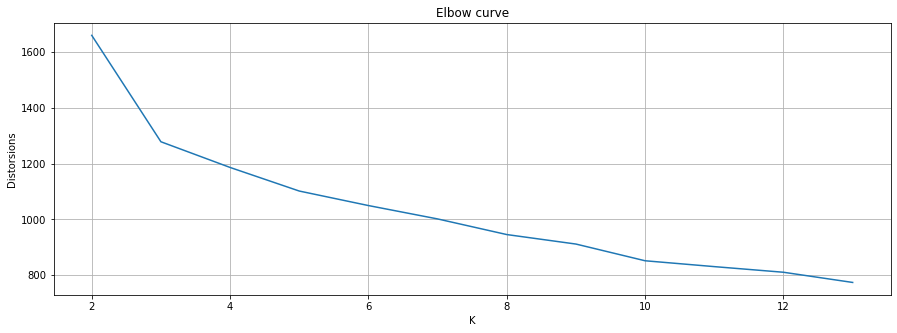

In [7]:
dis = []
for k in range(2, 14):
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(x)
    dis.append(kmeans.inertia_)

fig = plt.figure(figsize=(15, 5))
plt.plot(range(2, 14), dis)
plt.grid(True)
plt.xlabel('K')
plt.ylabel('Distorsions')
plt.title('Elbow curve');

In [34]:
range_n_clusters = list(range(2,12))
silhouette_avg_n_clusters = []
for n_clusters in range_n_clusters:
    clusterer = KMeans(n_clusters=n_clusters)
    cluster_labels = clusterer.fit_predict(x)

    silhouette_avg = silhouette_score(x, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

For n_clusters = 2 The average silhouette_score is : 0.26831340971052126
For n_clusters = 3 The average silhouette_score is : 0.2848589191898987
For n_clusters = 4 The average silhouette_score is : 0.24867713814255363
For n_clusters = 5 The average silhouette_score is : 0.23123607041125183
For n_clusters = 6 The average silhouette_score is : 0.19316296599497487
For n_clusters = 7 The average silhouette_score is : 0.20390956108611102
For n_clusters = 8 The average silhouette_score is : 0.1441506418643838
For n_clusters = 9 The average silhouette_score is : 0.1569204960072092
For n_clusters = 10 The average silhouette_score is : 0.14191297147264176
For n_clusters = 11 The average silhouette_score is : 0.13760498823891543


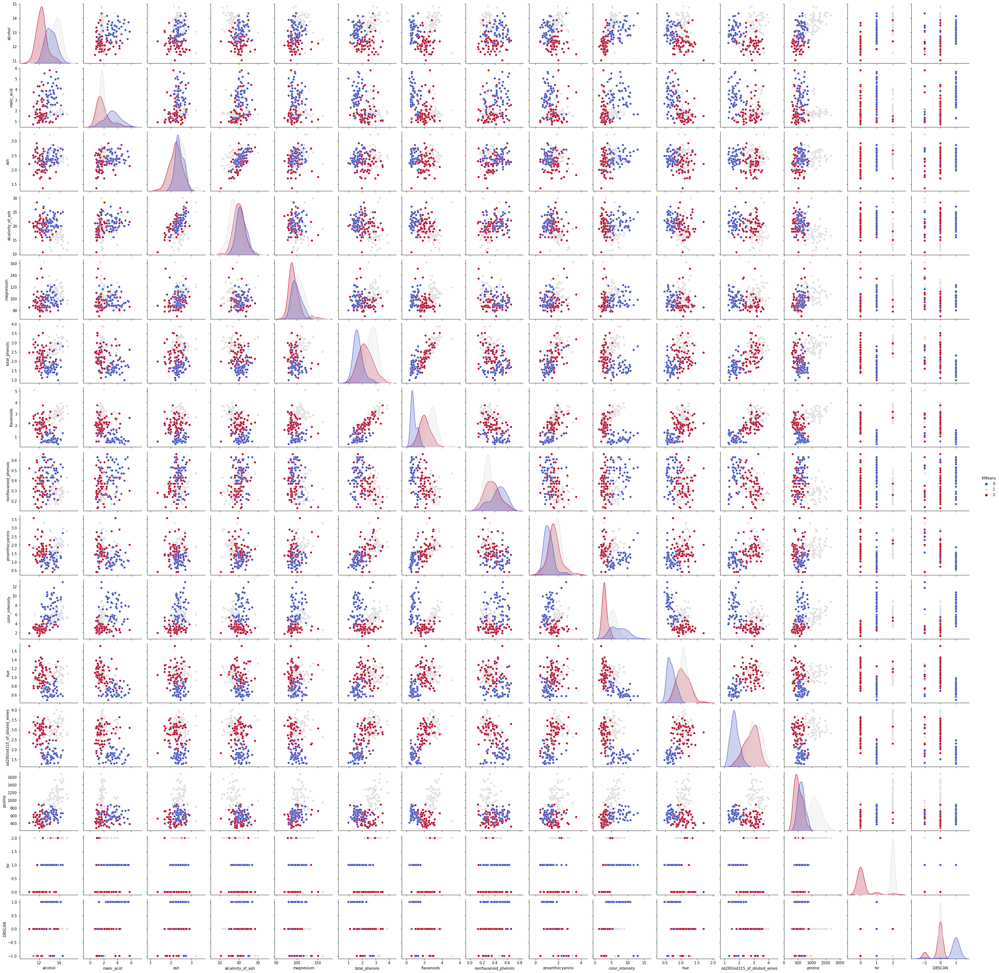

In [35]:
km=KMeans(n_clusters=3)
y_pred=km.fit_predict(x)

df['KMeans']=y_pred

sns.pairplot(data=df,hue='KMeans',diag_kind='kde',palette='coolwarm')

#### With dimension reduction

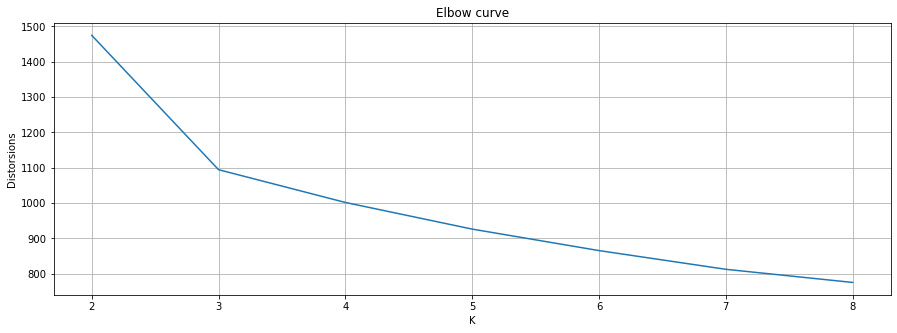

In [10]:
dis = []
for k in range(2, 9):
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(pc)
    dis.append(kmeans.inertia_)

fig = plt.figure(figsize=(15, 5))
plt.plot(range(2, 9), dis)
plt.grid(True)
plt.xlabel('K')
plt.ylabel('Distorsions')
plt.title('Elbow curve');

In [36]:
range_n_clusters = list(range(2,12))
silhouette_avg_n_clusters = []
for n_clusters in range_n_clusters:
    clusterer = KMeans(n_clusters=n_clusters)
    cluster_labels = clusterer.fit_predict(pc)

    silhouette_avg = silhouette_score(pc, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

For n_clusters = 2 The average silhouette_score is : 0.2930048322039009
For n_clusters = 3 The average silhouette_score is : 0.3149696954705562
For n_clusters = 4 The average silhouette_score is : 0.2717515620536826
For n_clusters = 5 The average silhouette_score is : 0.26552125911469443
For n_clusters = 6 The average silhouette_score is : 0.2608556427494248
For n_clusters = 7 The average silhouette_score is : 0.26396341871660006
For n_clusters = 8 The average silhouette_score is : 0.19611045360634657
For n_clusters = 9 The average silhouette_score is : 0.16052856971709858
For n_clusters = 10 The average silhouette_score is : 0.17520243694876048
For n_clusters = 11 The average silhouette_score is : 0.17379248641419728


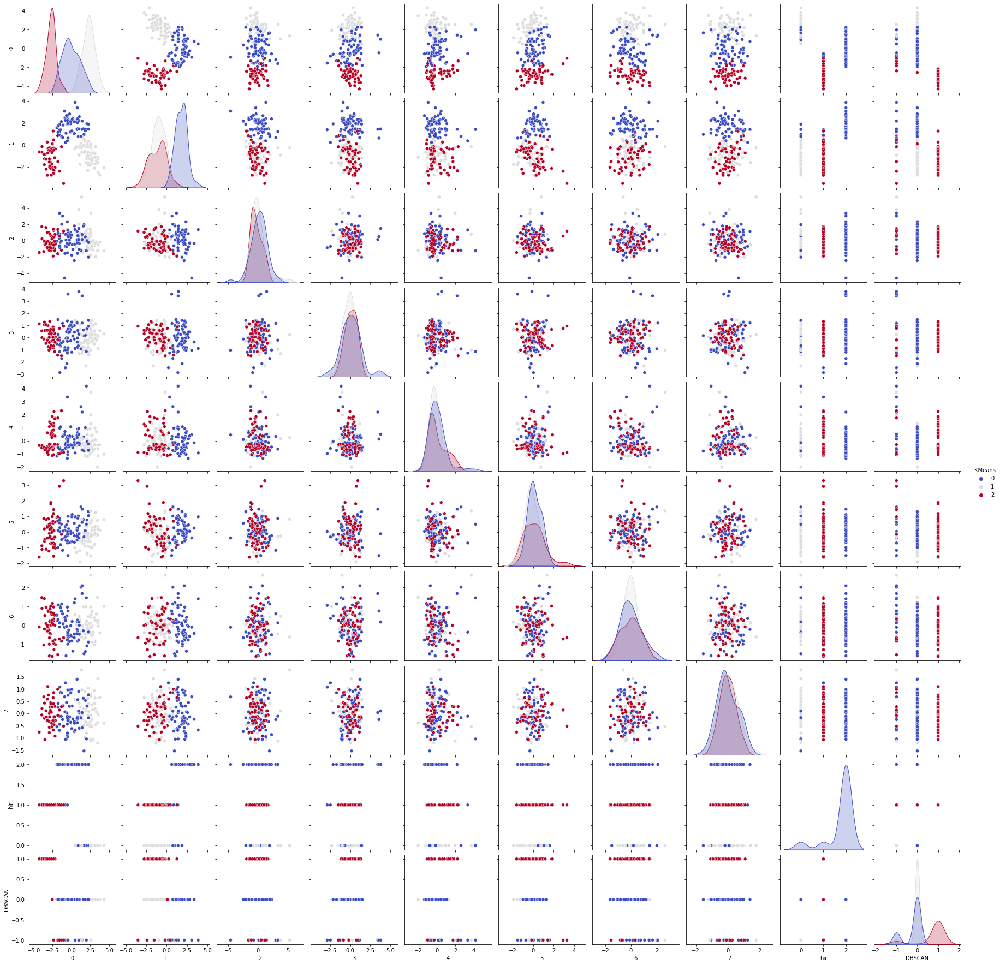

In [37]:
km=KMeans(n_clusters=3)
y_pred=km.fit_predict(pc)
dr['KMeans']=y_pred
sns.pairplot(data=dr,hue='KMeans',diag_kind='kde',palette='coolwarm')

# Task 4

### Heirarchal

#### Without dimension reduction

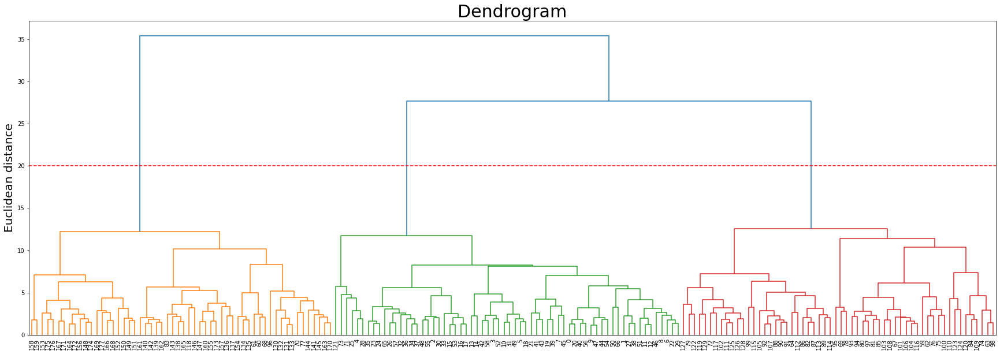

In [12]:
plt.figure(figsize=(30, 10))
dendrogrm = sch.dendrogram(sch.linkage(x, method = 'ward'),labels=df.index)
plt.axhline(y=20, color='r', linestyle='--')
ax = plt.gca()
ax.tick_params(axis='x', which='major', labelsize=10)
plt.title('Dendrogram',fontsize=30)
plt.ylabel('Euclidean distance', fontsize=20)
plt.show()

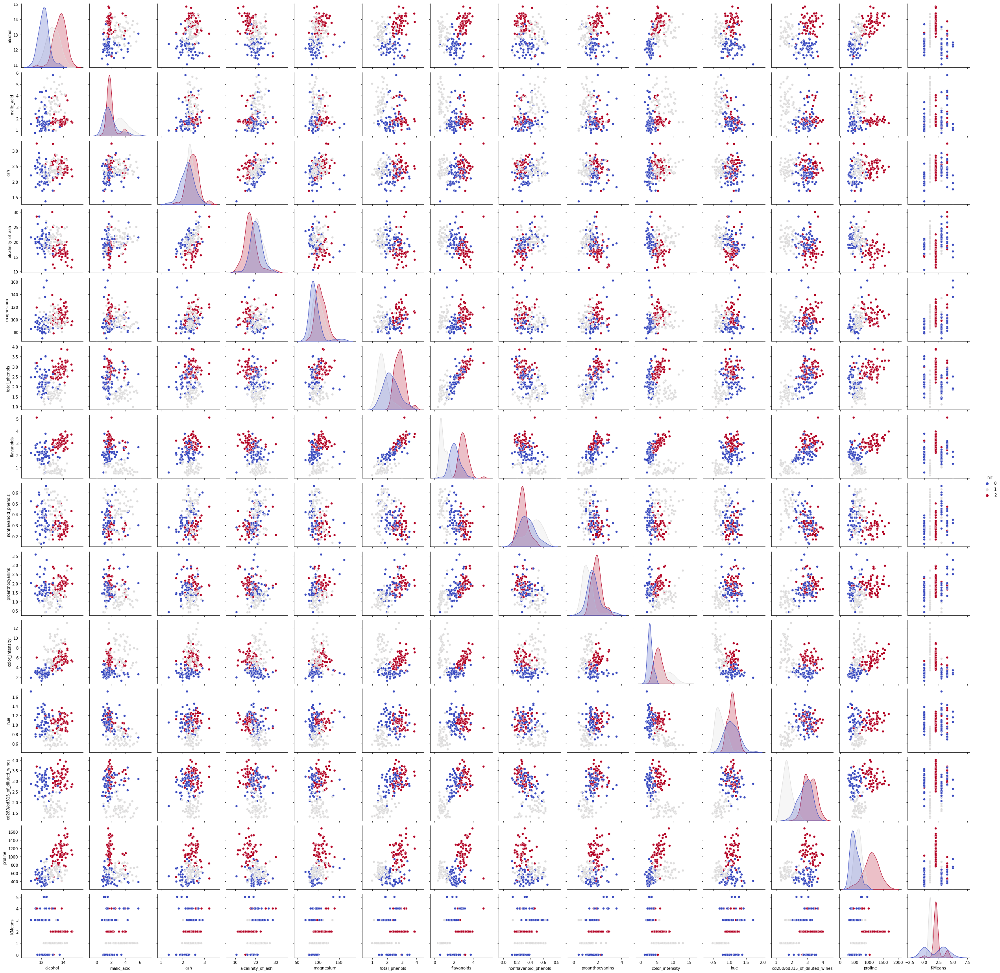

In [16]:
hc = AgglomerativeClustering(n_clusters = 3, affinity = 'euclidean', linkage = 'ward')
y_hc = hc.fit_predict(x)
df['hir']=y_hc
sns.pairplot(data=df,hue='hir',diag_kind='kde',palette='coolwarm')

#### With dimension reduction

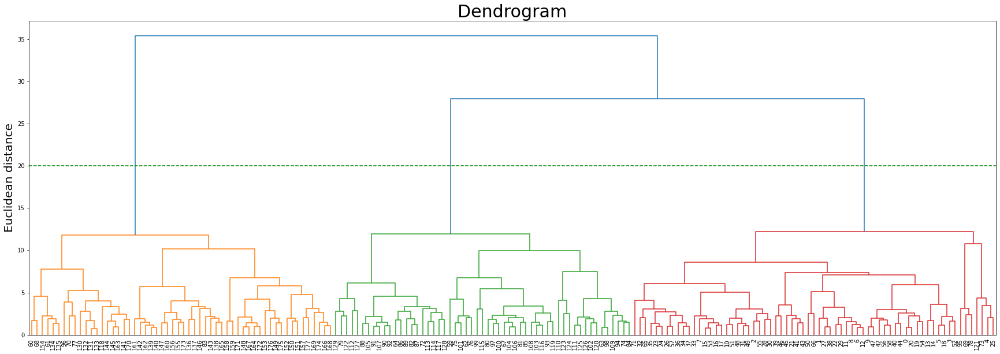

In [17]:
plt.figure(figsize=(30, 10))
dendrogrm = sch.dendrogram(sch.linkage(pc, method = 'ward'))
plt.axhline(y=20, color='g', linestyle='--')
ax = plt.gca()
ax.tick_params(axis='x', which='major', labelsize=10)
plt.title('Dendrogram',fontsize=30)

plt.ylabel('Euclidean distance', fontsize=20)
plt.show()

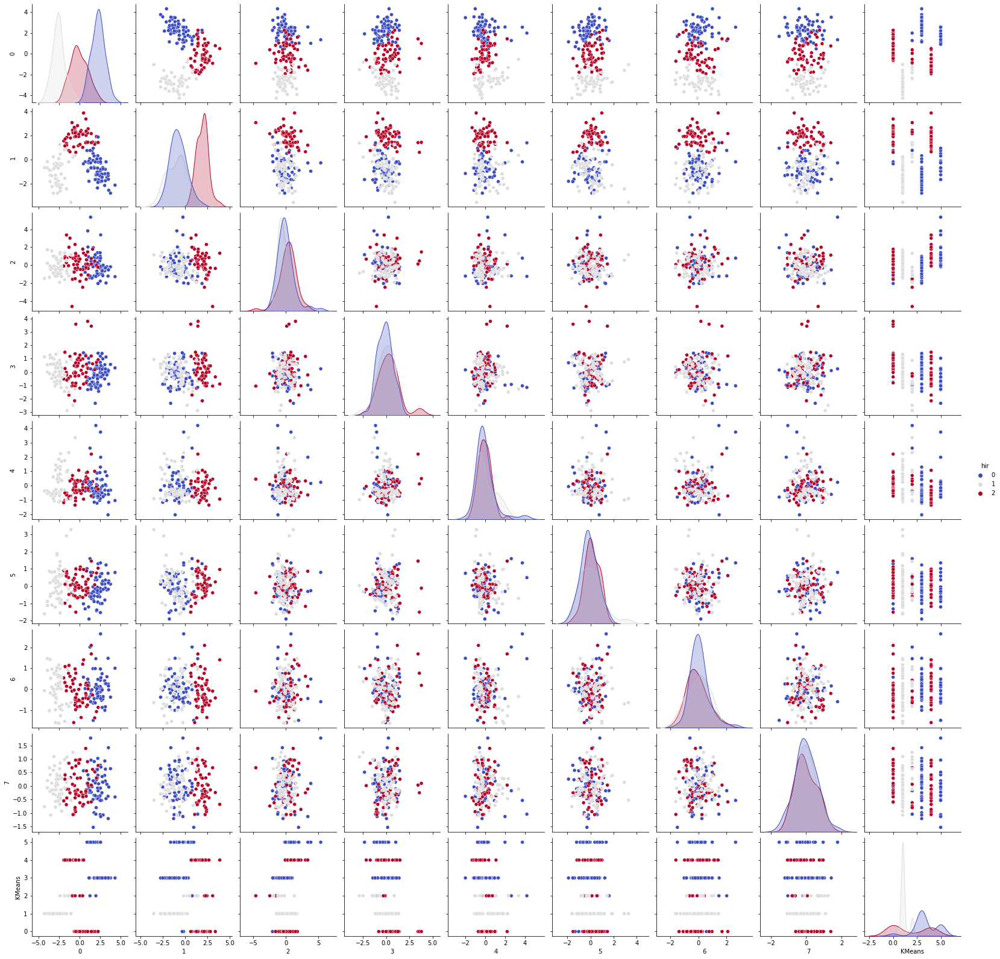

In [18]:
hc = AgglomerativeClustering(n_clusters = 3, affinity = 'euclidean', linkage = 'ward')
y_hc = hc.fit_predict(pc)
dr['hir']=y_hc
sns.pairplot(data=dr,hue='hir',diag_kind='kde',palette='coolwarm')

# Task 5

### DBSCAN

#### Without dimension reduction

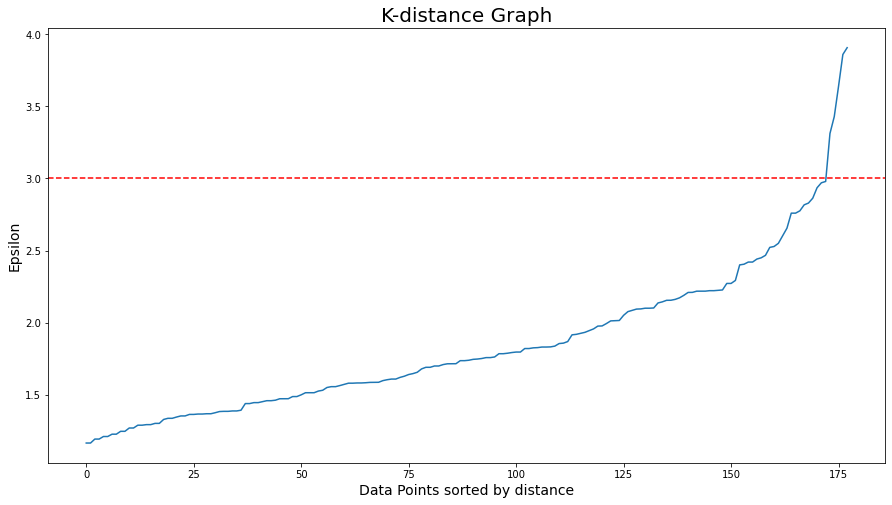

In [19]:
from sklearn.neighbors import NearestNeighbors
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(x)
distances, indices = nbrs.kneighbors(x)

# Plotting K-distance Graph
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.figure(figsize=(15,8))
plt.plot(distances)
plt.axhline(y=3, color='r', linestyle='--')
plt.title('K-distance Graph',fontsize=20)
plt.xlabel('Data Points sorted by distance',fontsize=14)
plt.ylabel('Epsilon',fontsize=14)
plt.show()

In [20]:
eps=3
for min_samples in range(2,30):
    clusterer = DBSCAN(eps=eps, min_samples=min_samples)
    cluster_labels = clusterer.fit_predict(x)

    X= cluster_labels +2
    y = np.bincount(X)
    ii = np.nonzero(y)[0]
    results = list(zip(ii,y[ii]) )
    print('eps=',eps,'| min_samples= ', min_samples, '| obtained clustering: ', results)

eps= 3 | min_samples=  2 | obtained clustering:  [(1, 5), (2, 168), (3, 3), (4, 2)]
eps= 3 | min_samples=  3 | obtained clustering:  [(1, 7), (2, 168), (3, 3)]
eps= 3 | min_samples=  4 | obtained clustering:  [(1, 11), (2, 167)]
eps= 3 | min_samples=  5 | obtained clustering:  [(1, 11), (2, 167)]
eps= 3 | min_samples=  6 | obtained clustering:  [(1, 11), (2, 167)]
eps= 3 | min_samples=  7 | obtained clustering:  [(1, 11), (2, 167)]
eps= 3 | min_samples=  8 | obtained clustering:  [(1, 11), (2, 167)]
eps= 3 | min_samples=  9 | obtained clustering:  [(1, 12), (2, 166)]
eps= 3 | min_samples=  10 | obtained clustering:  [(1, 12), (2, 166)]
eps= 3 | min_samples=  11 | obtained clustering:  [(1, 12), (2, 166)]
eps= 3 | min_samples=  12 | obtained clustering:  [(1, 12), (2, 166)]
eps= 3 | min_samples=  13 | obtained clustering:  [(1, 12), (2, 166)]
eps= 3 | min_samples=  14 | obtained clustering:  [(1, 13), (2, 165)]
eps= 3 | min_samples=  15 | obtained clustering:  [(1, 13), (2, 165)]
eps= 3

In [41]:
df.iloc[:,[0,1,2,3,4,5,6,7,9,10,11,12,15]]

,alcohol,malic_acid,ash,alcalinity_of_ash,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,color_intensity,hue,od280/od315_of_diluted_wines,proline,DBSCAN
0,14.23,1.71,2.43,15.6,127.0,2.80,3.06,0.28,5.64,1.04,3.92,1065.0,0
1,13.20,1.78,2.14,11.2,100.0,2.65,2.76,0.26,4.38,1.05,3.40,1050.0,0
2,13.16,2.36,2.67,18.6,101.0,2.80,3.24,0.30,5.68,1.03,3.17,1185.0,0
3,14.37,1.95,2.50,16.8,113.0,3.85,3.49,0.24,7.80,0.86,3.45,1480.0,0
4,13.24,2.59,2.87,21.0,118.0,2.80,2.69,0.39,4.32,1.04,2.93,735.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,13.71,5.65,2.45,20.5,95.0,1.68,0.61,0.52,7.70,0.64,1.74,740.0,1
174,13.40,3.91,2.48,23.0,102.0,1.80,0.75,0.43,7.30,0.70,1.56,750.0,1
175,13.27,4.28,2.26,20.0,120.0,1.59,0.69,0.43,10.20,0.59,1.56,835.0,1
176,13.17,2.59,2.37,20.0,120.0,1.65,0.68,0.53,9.30,0.60,1.62,840.0,1


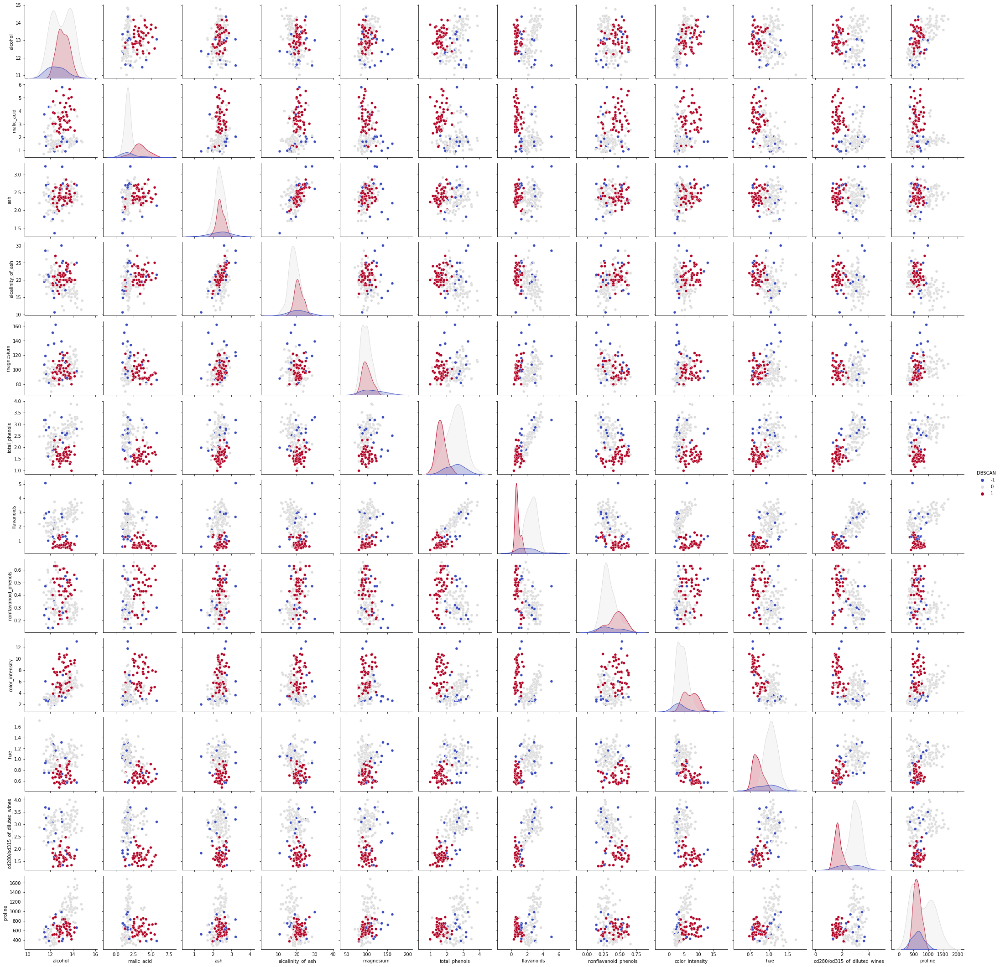

In [21]:
db_o=DBSCAN(eps=3,min_samples=22)
db_o.fit(x)
y_db=db_o.labels_
df['DBSCAN']=y_db

sns.pairplot(data=df.iloc[:,[0,1,2,3,4,5,6,7,9,10,11,12,15]],hue='DBSCAN',diag_kind='kde',palette='coolwarm')

#### With dimension reduction

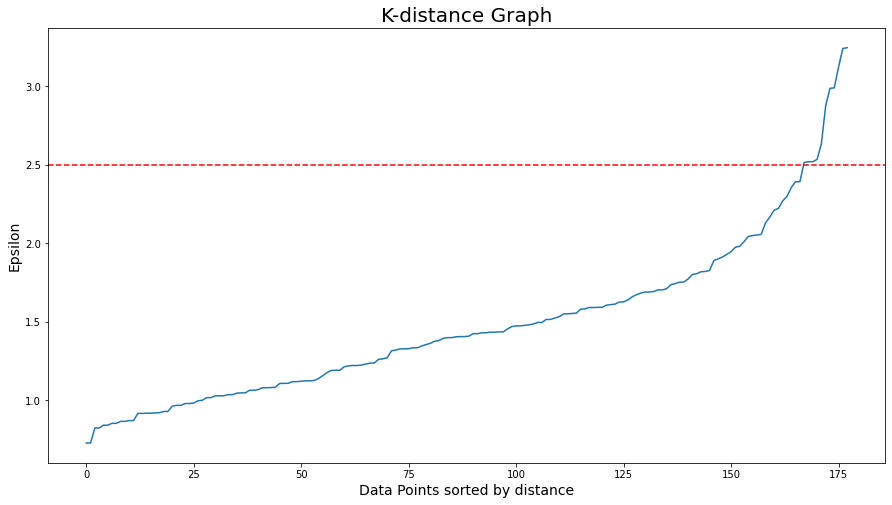

In [22]:
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(pc)
distances, indices = nbrs.kneighbors(pc)

distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.figure(figsize=(15,8))
plt.plot(distances)
plt.axhline(y=2.5, color='r', linestyle='--')
plt.title('K-distance Graph',fontsize=20)
plt.xlabel('Data Points sorted by distance',fontsize=14)
plt.ylabel('Epsilon',fontsize=14)
plt.show()

In [23]:
eps=2.5
for min_samples in range(2,30):
    clusterer = DBSCAN(eps=eps, min_samples=min_samples)
    cluster_labels = clusterer.fit_predict(pc)

    X= cluster_labels +2
    y = np.bincount(X)
    ii = np.nonzero(y)[0]
    results = list(zip(ii,y[ii]) )
    print('eps=',eps,'| min_samples= ', min_samples, '| obtained clustering: ', results)

eps= 2.5 | min_samples=  2 | obtained clustering:  [(1, 11), (2, 163), (3, 2), (4, 2)]
eps= 2.5 | min_samples=  3 | obtained clustering:  [(1, 15), (2, 163)]
eps= 2.5 | min_samples=  4 | obtained clustering:  [(1, 15), (2, 163)]
eps= 2.5 | min_samples=  5 | obtained clustering:  [(1, 15), (2, 163)]
eps= 2.5 | min_samples=  6 | obtained clustering:  [(1, 16), (2, 162)]
eps= 2.5 | min_samples=  7 | obtained clustering:  [(1, 16), (2, 162)]
eps= 2.5 | min_samples=  8 | obtained clustering:  [(1, 16), (2, 162)]
eps= 2.5 | min_samples=  9 | obtained clustering:  [(1, 18), (2, 160)]
eps= 2.5 | min_samples=  10 | obtained clustering:  [(1, 18), (2, 160)]
eps= 2.5 | min_samples=  11 | obtained clustering:  [(1, 19), (2, 159)]
eps= 2.5 | min_samples=  12 | obtained clustering:  [(1, 19), (2, 159)]
eps= 2.5 | min_samples=  13 | obtained clustering:  [(1, 19), (2, 159)]
eps= 2.5 | min_samples=  14 | obtained clustering:  [(1, 22), (2, 156)]
eps= 2.5 | min_samples=  15 | obtained clustering:  [(1,

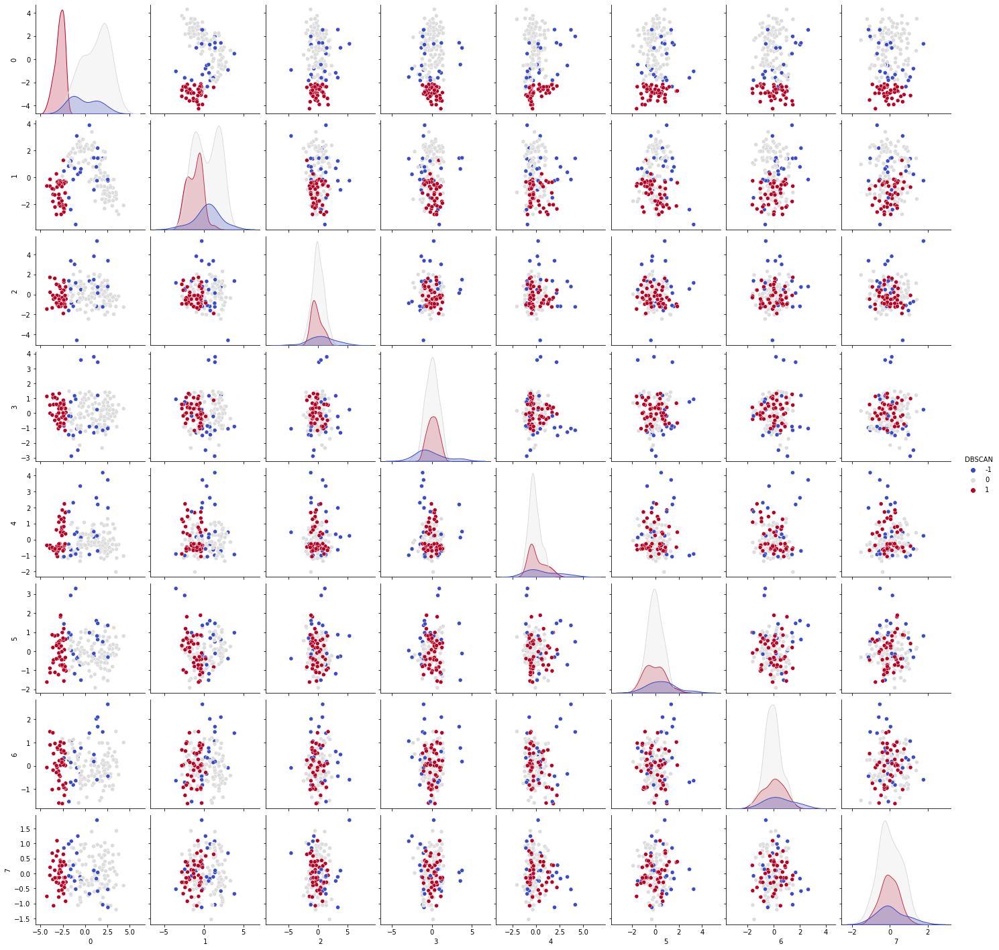

In [24]:
db_opt=DBSCAN(eps=2.5,min_samples=15)
db_opt.fit(pc)
y_db=db_opt.labels_ 
dr['DBSCAN']=y_db

sns.pairplot(data=dr.iloc[:,[0,1,2,3,4,5,6,7,10]],hue='DBSCAN',diag_kind='kde',palette='coolwarm')